In [2]:
# Import necessary modules
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# Interactive plotting
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # ‘png’, ‘retina’, ‘jpeg’, ‘svg’, ‘pdf’

Reference Notebook: EDA_Example_2_1

### 1. Our data

#### Load data
First step will always be having our data available. In this case, we will use:

* **pima-indians-diabetes.csv**: This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage. 

    Columns info:
    
    - pregnancies: number of times pregnant
    - glucose: plasma glucose concentration
    - blood_pressure: diastollic blood pressure
    - skin_thickness: triceps skin fold thickness
    - insulin: serum insulin
    - bmi: body max index
    - diabetes_pedigree_function:
    - age
    - Y: patient has diabetes or not
    
Consider:
- Use `read_csv` from pandas
- Write correct path
- Use correct separator `sep`

In this case, load file with `sep = ","` and `header = None`

In [90]:
df = pd.read_csv("data/pima-indians-diabetes.csv", sep = ",")


#### Explore file

* What are the input variables?

In [95]:
df[["pregnancies","glucose","blood_pressure",
              "skin_thickness","insulin","BMI","diabetes_pedigree_function",
              "age"]].head(5)

,pregnancies,glucose,blood_pressure,skin_thickness,insulin,BMI,diabetes_pedigree_function,age
0,6,NaN,72,35,0.0,33.6,0.627,50
1,1,85.0,66,29,0.0,26.6,0.351,31
2,8,183.0,64,0,0.0,23.3,0.672,32
3,1,89.0,66,23,94.0,28.1,0.167,21
4,0,137.0,40,35,168.0,43.1,2.288,33


* What is the typology of these variables?

In [96]:
df.dtypes

pregnancies                     int64
glucose                       float64
blood_pressure                  int64
skin_thickness                  int64
insulin                       float64
BMI                           float64
diabetes_pedigree_function    float64
age                             int64
Y                               int64
dtype: object

* What is the target?

In [97]:
df['Y'].head(5)

0    1
1    0
2    1
3    0
4    1
Name: Y, dtype: int64

* What is the shape of dataframe?

In [98]:
df.shape

(768, 9)

### 2. Preprocessing and data cleansing

As we've seen in theory, 

    Data cleansing is one of the most important steps when dealing with a ML problem, but it can be less appealing than other tasks.

#### Deal with missing values (NA)

* Show how many missing values have each column:

In [99]:
# first option
print('Number of missing values in dataframe:',df.isnull().values.sum())
# second option
df.isnull().any()

Number of missing values in dataframe: 2


pregnancies                   False
glucose                        True
blood_pressure                False
skin_thickness                False
insulin                        True
BMI                           False
diabetes_pedigree_function    False
age                           False
Y                             False
dtype: bool

* What do you think is the best option in this case to treat the missing values? 

    - Removal: [dropna](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dropna.html)
    - Substitution: [fillna](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html)

Apply your criterion:

In [100]:
df.dropna(inplace=True)

In [101]:
# Check results
df.isnull().any()

pregnancies                   False
glucose                       False
blood_pressure                False
skin_thickness                False
insulin                       False
BMI                           False
diabetes_pedigree_function    False
age                           False
Y                             False
dtype: bool

#### Plot the data and look for outliers

As we've seen in theory, outliers are:

    Samples that are exceptionally far from the mainstream of the data
    
Note: Applied to numeric columns.

Two basic ways to detect them:

* Using graph tools: Plot histogram or boxplot of all dataframe variables.


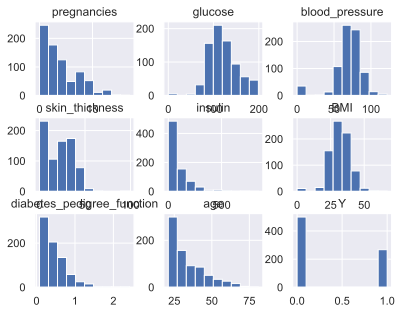

In [105]:
# histogram:
df.hist()
plt.show()

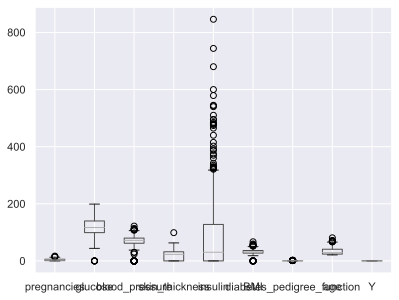

In [104]:
# boxplot
df.boxplot()
plt.show()

* Analytically using statistics: 

[IQR (Inter Quartile Range)](https://www.geeksforgeeks.org/interquartile-range-iqr/) Inter Quartile Range approach to finding the outliers is the most commonly used and most trusted approach used in the research field.


In [106]:
# example: insulin
Q1 = np.percentile(df['insulin'], 25,
                   method = 'midpoint')
Q3 = np.percentile(df['insulin'], 75,
                   method = 'midpoint')
IQR = Q3 - Q1


upper = df['insulin'] >= (Q3+1.5*IQR)
lower = df['insulin'] <= (Q1-1.5*IQR)

# 1. mean replace
# df.loc[upper,'insulin'] = np.mean(df['insulin'])
# df.loc[lower, 'insulin'] = np.mean(df['insulin'])

# 2. nan replace and drop it
# df.loc[upper,'insulin'] = np.nan
# df.loc[lower, 'insulin'] = np.nan
# df.drop(inplace = True)
# Warning!! we should to check how many rows we have. It could be dangerous remove 
# high proportion of rows.

# 3. Nothing :)

What should we do? Remove them? Replace them? Nothing? 

#### Encode categorical variables

* In our case, there are no categorical input variables.

* Convert target variable to factor

In [108]:
df.Y = df.Y.astype('category')
df.dtypes

pregnancies                      int64
glucose                        float64
blood_pressure                   int64
skin_thickness                   int64
insulin                        float64
BMI                            float64
diabetes_pedigree_function     float64
age                              int64
Y                             category
dtype: object

#### Analyse continuous variables

We shoud standarize variables, but in this practice we won't apply because in future we'll use a pipeline to make it easier all steps before modeling.

Relationship between variables. Our task is to find out if exists any relation between predictors. 

* Plot pairplot (seaborn) where:
    - data = df
    - hue = 'Y'

In [109]:
sns.pairplot(df, hue = 'Y')

To find out if exists collinearity is through the confusion matrix.

* Plot correlation matrix using `df.corr(method = 'pearson')`

In [110]:
df.corr(method ='pearson')

,pregnancies,glucose,blood_pressure,skin_thickness,insulin,BMI,diabetes_pedigree_function,age
pregnancies,1.000000,0.128786,0.142104,-0.082580,-0.073069,0.016915,-0.034281,0.543766
glucose,0.128786,1.000000,0.152786,0.056367,0.332376,0.220928,0.136849,0.262432
blood_pressure,0.142104,0.152786,1.000000,0.207601,0.089275,0.283344,0.041893,0.241392
skin_thickness,-0.082580,0.056367,0.207601,1.000000,0.437969,0.392639,0.183467,-0.116085
insulin,-0.073069,0.332376,0.089275,0.437969,1.000000,0.198121,0.185559,-0.041076
BMI,0.016915,0.220928,0.283344,0.392639,0.198121,1.000000,0.140097,0.034783
diabetes_pedigree_function,-0.034281,0.136849,0.041893,0.183467,0.185559,0.140097,1.000000,0.032115
age,0.543766,0.262432,0.241392,-0.116085,-0.041076,0.034783,0.032115,1.000000


Draw your conclusions from results

#### Deal with class imbalances

To verify that there is class imbalance you should to observe the proportion of each category of target variable:

In [111]:
df['Y'].value_counts()*100/df['Y'].shape[0]

0    65.143603
1    34.856397
Name: Y, dtype: float64

### Split data intro train/test

#### Define feature and target matrix

In [112]:
features = list(df.columns)
target = 'Y'
features.remove(target)

In [113]:
X = df[features]
y = df[target]

#### Split
Based on [train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html) create X_train,X_test,y_train and y_test where:
- test_size = 0.2 (percentage of test data)
- random_state = 0 (seed for replication)
- stratify = target name (Preserves distribution of y)

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  
                                                    random_state=0, 
                                                    stratify = y)  

Check all data generated: 

* Save data in csv file naming the following way:
- X_train: `X_train.csv`
- y_train: `y_train.csv`
- X_test: `X_test.csv`
- y_test: `y_test.csv`

with `sep=','` and `index = False`

It will be useful for the next practice

In [115]:
X_train.to_csv("data/X_train_diabetes.csv", sep = ',', index = False)
y_train.to_csv("data/y_train_diabetes.csv", sep = ',', index = False)
X_test.to_csv("data/X_test_diabetes.csv", sep = ',', index = False)
y_test.to_csv("data/y_test_diabetes.csv", sep = ',', index = False)
